In [1]:
#pip install wordcloud

In [16]:
#pip install pymystem3

In [28]:
# импорт необходимых библиотек
import pandas as pd
import numpy as np
import re
from pymystem3 import Mystem
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from stop_words import get_stop_words
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [18]:
# вывод данных по договорам
contracts_df = pd.read_csv('data/contracts_df.csv')
contracts_df.head()

,contract_id,kind_id,kind_name,greate_date,contract_name,contract,text,lemm_text_list,lemm_text
0,1,5,Договор поставки,2022-12-26,5908cb5da047d6c9e6dfea6337fb3189.doc,\r\t\tДОГОВОР \r\rг. Москва«__» ________ 2012...,договор г москва г ...,"['г', 'москва', 'г', 'общество', 'с', 'огранич...",г москва г общество с ограниченный ответственн...
1,2,5,Договор поставки,2022-12-26,14711e4fc8e56f0c75856c8837ec04cb.doc,"\r\r\rДоговор №______________\r\r\r Дата, мест...",договор дата место закл...,"['дата', 'место', 'заключение', 'населенный', ...",дата место заключение населенный пункт именова...
2,3,5,Договор поставки,2022-12-26,7eb67b5aecf3f3190aab0a5f8ea32172.docx,\r\r\t\t\r\rДОГОВОР ЗАКУПКИ № __________/\r\rг...,договор закупки г ...,"['закупка', 'г', 'г', 'общество', 'с', 'ограни...",закупка г г общество с ограниченный ответствен...
3,4,5,Договор поставки,2022-12-26,b40a9d048b199d5f4db62a6a2335f2a0.pdf,\rДОГОВОР ПОСТАВКИ № 1 \rг. Москва «11...,договор поставки г москва ...,"['поставка', 'г', 'москва', 'декабрь', 'г', 'о...",поставка г москва декабрь г общество с огранич...
4,5,5,Договор поставки,2022-12-26,84fec112d02288861e7af59f468131fb.docx,\rДоговор № {НомерДокумента}\r{ДатаДокумента...,договор номердокумента датадокумента ...,"['номердокумент', 'датадокумент', 'названиекон...",номердокумент датадокумент названиеконтры имен...


In [19]:
# сведения по данным
contracts_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   contract_id     120 non-null    int64 
 1   kind_id         120 non-null    int64 
 2   kind_name       120 non-null    object
 3   greate_date     120 non-null    object
 4   contract_name   120 non-null    object
 5   contract        120 non-null    object
 6   text            120 non-null    object
 7   lemm_text_list  120 non-null    object
 8   lemm_text       120 non-null    object
dtypes: int64(2), object(7)
memory usage: 8.6+ KB


In [20]:
# проверка на наличие пропусков
contracts_df.isna().sum()

contract_id       0
kind_id           0
kind_name         0
greate_date       0
contract_name     0
contract          0
text              0
lemm_text_list    0
lemm_text         0
dtype: int64

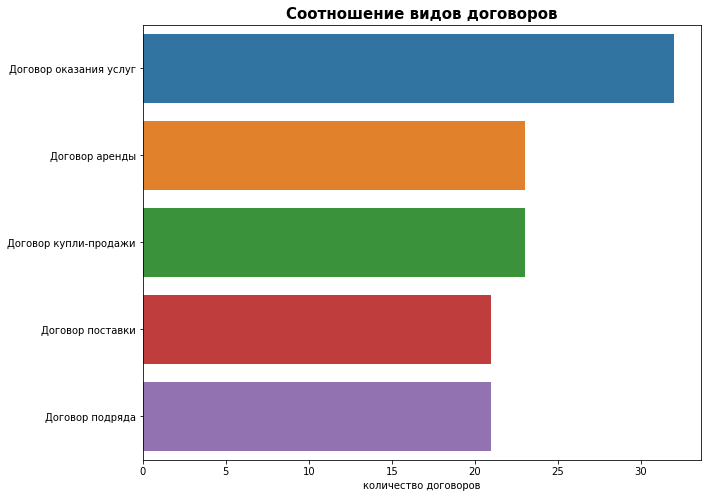

In [21]:
# визуализация соотнощения видов договоров
plt.figure(figsize=(10,8))
sns.countplot(y = 'kind_name' , order=contracts_df['kind_name'].value_counts().index, data = contracts_df) \
.set_title('Соотношение видов договоров', fontweight='bold', fontsize=15)
plt.xlabel('количество договоров', fontsize=10)
plt.ylabel('')
plt.show()

Явного дисбаланса классов **нет**, методы борьбы с дисбалансов при обучении модели применять **не** будем

# Анализ содержания текстов договора

In [22]:
# инициализация элемента класса Mystem() для последующей лемматизации текста на русском языке
m = Mystem() 

In [23]:
# функция для лемматизации текста
def lemmatize(text):
    
    return [i for i in m.lemmatize(text) if len(i.strip()) > 0]

In [24]:
%%time
# формирование столбца 'text' - текстового содержания договора в нижнем регистре
contracts_df['text'] = contracts_df['contract'].apply(lambda x: x.lower())
# в тексте договра оставляем только кириллицу
contracts_df['text'] = contracts_df['text'].apply(lambda x: re.sub('[^а-яА-ЯёЁ]', ' ', x)) 
# лемматизируем текст договора из столбца 'text' и формируем столбец 'lemm_text_list' - список лемматизированных слов договора
contracts_df['lemm_text_list'] = contracts_df['text'].apply(lemmatize)
# убираем слова, содержащие и договор из списка лемматизированных слов договора, как явно не релевантное для данной задачи
contracts_df['lemm_text_list'] = contracts_df['lemm_text_list'] \
                                 .apply(lambda x: [word for word in x if 'договор' not in word and 'сторон' not in word])
# формируем столбец 'lemm_text' - лемматизированный тест договора
contracts_df['lemm_text'] = contracts_df['lemm_text_list'].apply(lambda x: ' '.join(x))

CPU times: total: 906 ms
Wall time: 1min 43s


In [26]:
# преобразование содержания лемматизированных текстов договоров в единую строку
text = ' '.join(list(contracts_df['lemm_text'].values))

In [29]:
# задания параметров облака слов

STOPWORDS_RU = get_stop_words('russian')

wordcloud = WordCloud(width = 3000, 
                      height = 2000, 
                      random_state=42,
                      background_color='white',
                      repeat = True,
                      collocations=False,
                      stopwords = STOPWORDS_RU)

In [30]:
# формирование облака слов
wordcloud_all = wordcloud.generate(text)

In [31]:
# функция визуализации облака слов
def plot_cloud(wordcloud):
    plt.figure(figsize=(40, 30))
    plt.imshow(wordcloud) 
    plt.axis('off')

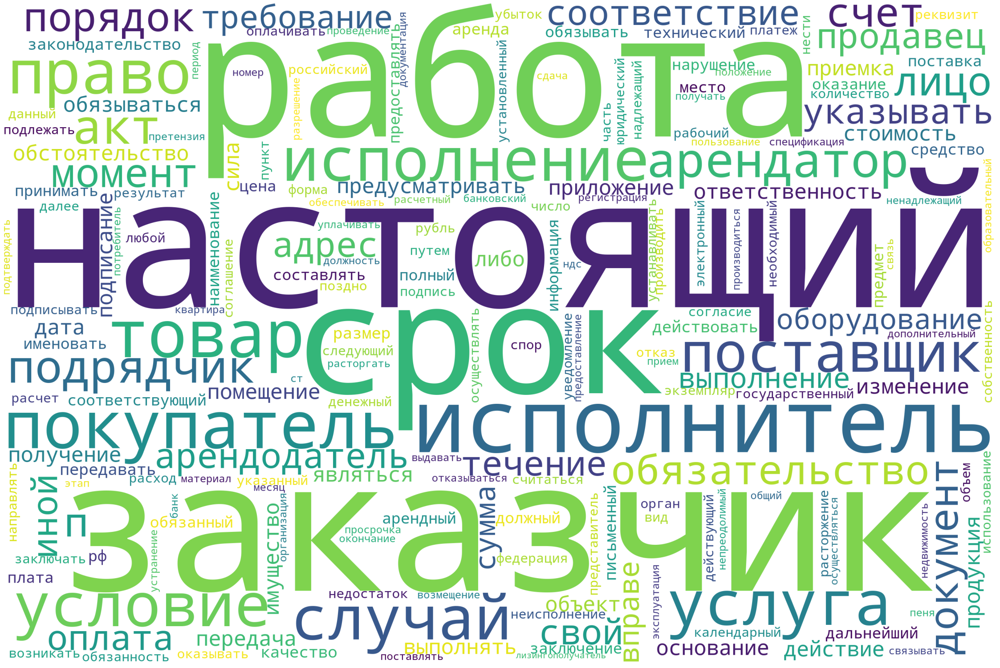

In [32]:
# визуализация сформированного облака слов
plot_cloud(wordcloud_all)

In [23]:
# уникальные наименования видов договоров
contracts_df['kind_name'].unique()

array(['Договор поставки', 'Договор оказания услуг', 'Договор подряда',
       'Договор аренды', 'Договор купли-продажи'], dtype=object)

In [24]:
# выборка договоров аренды и преобразование содержания лемматизированных текстов договоров в единую строку
text_rent = ' '.join(list(contracts_df.query('kind_name == "Договор аренды"')['lemm_text'].apply(lambda x: x.lower()).values))

In [25]:
# формирование облака слов
wordcloud_rent = wordcloud.generate(text_rent)

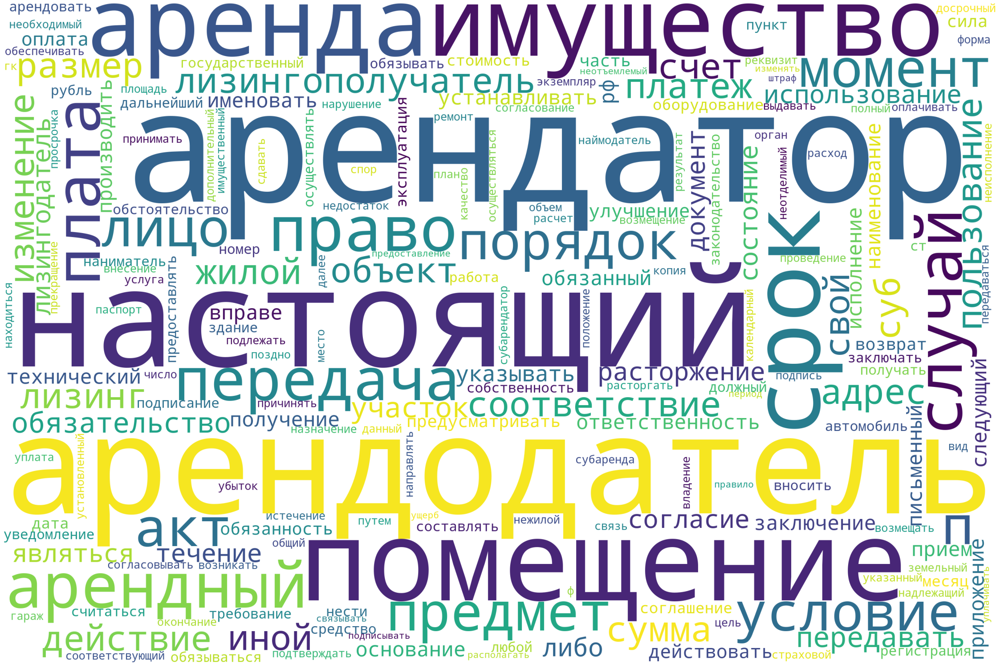

In [26]:
# визуализация сформированного облака слов
plot_cloud(wordcloud_rent)

Ключевыми словами в договорах вида **"Договор аренды"** являются ***слова***:
* арендатор
* арендодатель
* помещение
* имущество

In [27]:
# выборка договоров подряда и преобразование содержания лемматизированных текстов договоров в единую строку
text_contract = ' '.join(list(contracts_df.query('kind_name == "Договор подряда"')['lemm_text'].apply(lambda x: x.lower()).values))

In [28]:
# формирование облака слов
wordcloud_contract = wordcloud.generate(text_contract)

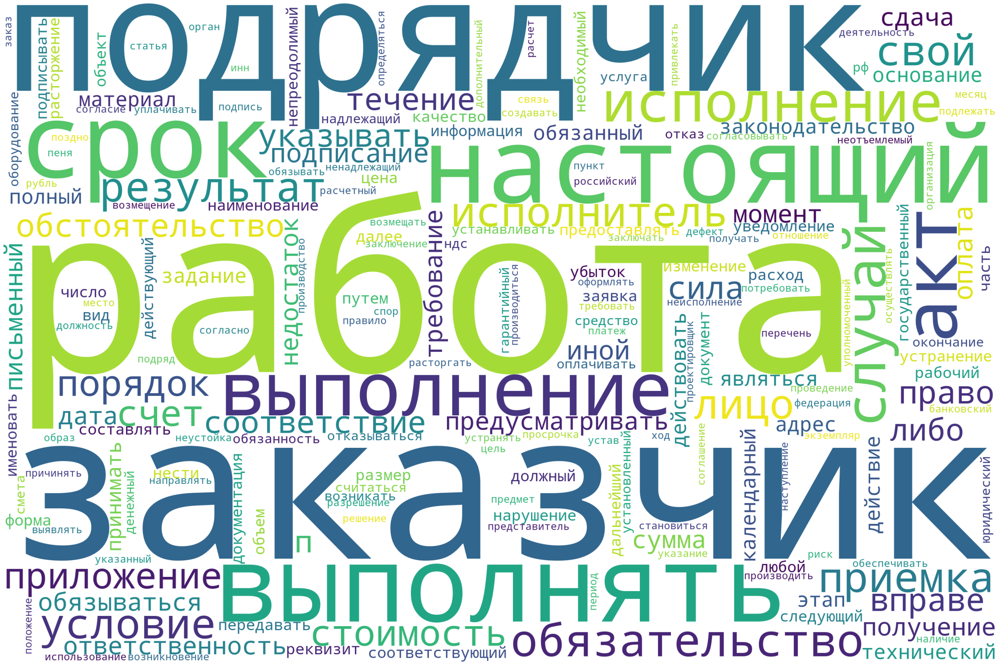

In [29]:
# визуализация сформированного облака слов
plot_cloud(wordcloud_contract)

Ключевыми словами в договорах вида **"Договор подряда"** являются ***слова***:
* подрядчик
* заказчик
* работа

In [30]:
# выборка договоров поставки и преобразование содержания лемматизированных текстов договоров в единую строку
text_supply = ' '.join(list(contracts_df.query('kind_name == "Договор поставки"')['lemm_text'].apply(lambda x: x.lower()).values))

In [31]:
# формирование облака слов
wordcloud_supply = wordcloud.generate(text_supply)

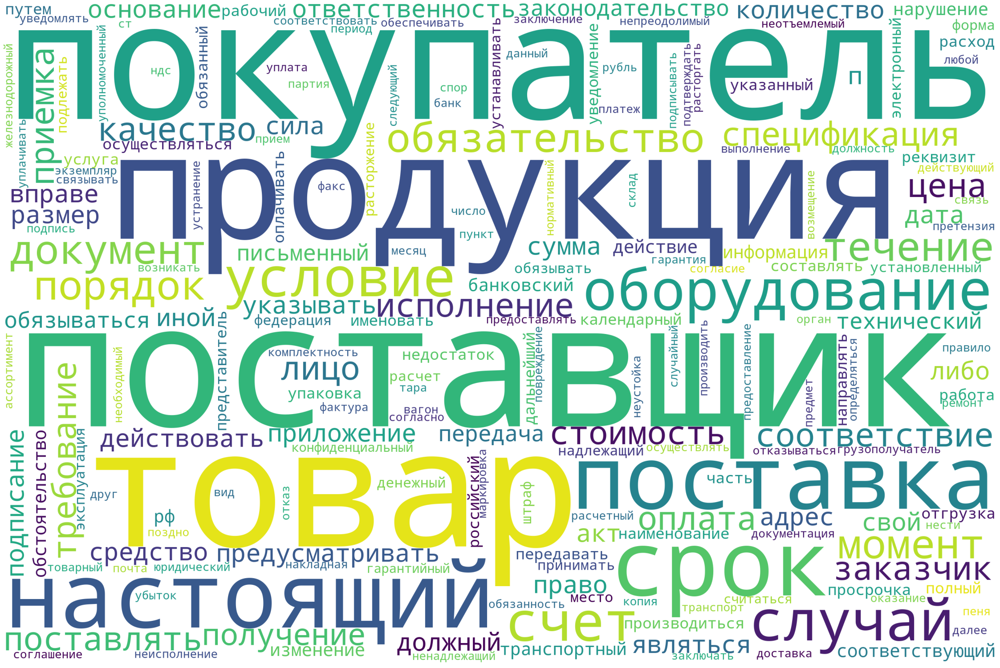

In [32]:
# визуализация сформированного облака слов
plot_cloud(wordcloud_supply)

Ключевыми словами в договорах вида **"Договор поставки"** являются ***слова***:
* покупатель
* поставщик
* продукция
* товар

In [36]:
# выборка договоров поставки и преобразование содержания лемматизированных текстов договоров в единую строку
text_services = ' '.join(list(contracts_df.query('kind_name == "Договор оказания услуг"')['lemm_text'].apply(lambda x: x.lower()).values))

In [37]:
# формирование облака слов
wordcloud_services = wordcloud.generate(text_services)

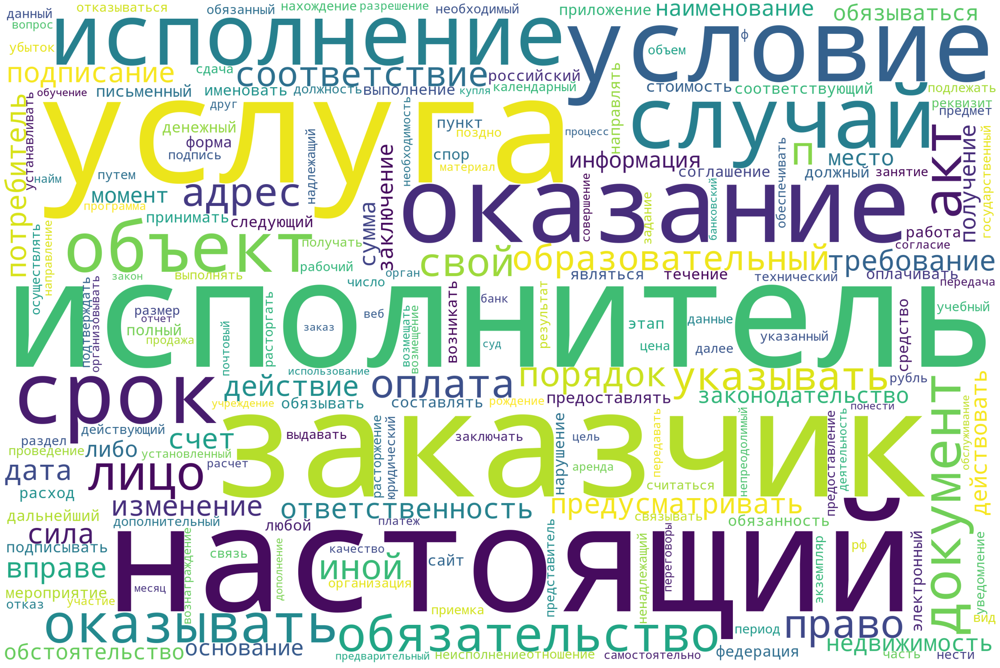

In [38]:
# визуализация сформированного облака слов
plot_cloud(wordcloud_services)

Ключевыми словами в договорах вида **"Договор оказания услуг"** являются ***слова***:
* заказчик
* исполнитель
* услуга
* оказание

In [40]:
# выборка договоров купли-продажи и преобразование содержания лемматизированных текстов договоров в единую строку
text_purchase = ' '.join(list(contracts_df.query('kind_name == "Договор купли-продажи"')['lemm_text'].apply(lambda x: x.lower()).values))

In [41]:
# формирование облака слов
wordcloud_purchase = wordcloud.generate(text_purchase)

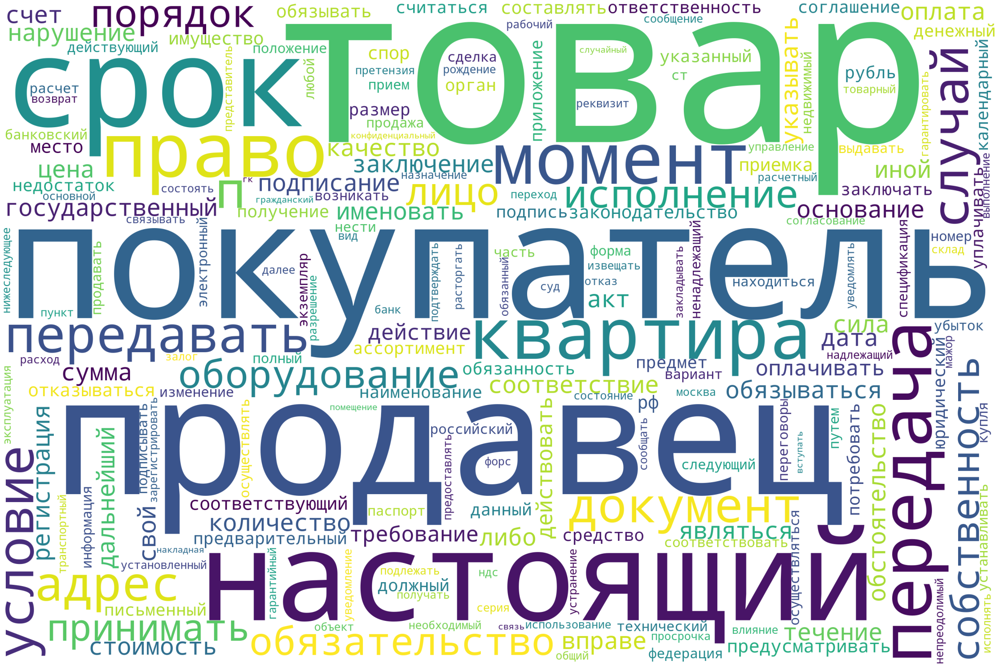

In [42]:
# визуализация сформированного облака слов
plot_cloud(wordcloud_purchase)

Ключевыми словами в договорах вида **"Договор купли-продажи"** являются ***слова***:
* продавец
* покупатель
* товар

In [14]:
# вывод данных
contracts_df.head()

,contract_id,kind_id,kind_name,greate_date,contract_name,contract,text,lemm_text_list,lemm_text
0,1,5,Договор поставки,2022-12-26,5908cb5da047d6c9e6dfea6337fb3189.doc,\r\t\tДОГОВОР \r\rг. Москва«__» ________ 2012...,договор г москва г ...,"[г, москва, г, общество, с, ограниченный, отве...",г москва г общество с ограниченный ответственн...
1,2,5,Договор поставки,2022-12-26,14711e4fc8e56f0c75856c8837ec04cb.doc,"\r\r\rДоговор №______________\r\r\r Дата, мест...",договор дата место закл...,"[дата, место, заключение, населенный, пункт, и...",дата место заключение населенный пункт именова...
2,3,5,Договор поставки,2022-12-26,7eb67b5aecf3f3190aab0a5f8ea32172.docx,\r\r\t\t\r\rДОГОВОР ЗАКУПКИ № __________/\r\rг...,договор закупки г ...,"[закупка, г, г, общество, с, ограниченный, отв...",закупка г г общество с ограниченный ответствен...
3,4,5,Договор поставки,2022-12-26,b40a9d048b199d5f4db62a6a2335f2a0.pdf,\rДОГОВОР ПОСТАВКИ № 1 \rг. Москва «11...,договор поставки г москва ...,"[поставка, г, москва, декабрь, г, общество, с,...",поставка г москва декабрь г общество с огранич...
4,5,5,Договор поставки,2022-12-26,84fec112d02288861e7af59f468131fb.docx,\rДоговор № {НомерДокумента}\r{ДатаДокумента...,договор номердокумента датадокумента ...,"[номердокумент, датадокумент, названиеконтры, ...",номердокумент датадокумент названиеконтры имен...


In [15]:
# проверка наличия пропусков
contracts_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120 entries, 0 to 119
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   contract_id     120 non-null    int64 
 1   kind_id         120 non-null    int64 
 2   kind_name       120 non-null    object
 3   greate_date     120 non-null    object
 4   contract_name   120 non-null    object
 5   contract        120 non-null    object
 6   text            120 non-null    object
 7   lemm_text_list  120 non-null    object
 8   lemm_text       120 non-null    object
dtypes: int64(2), object(7)
memory usage: 8.6+ KB


In [16]:
# сохранение в файл
contracts_df.to_csv('data/contracts_df.csv', index=False)